<a href="https://colab.research.google.com/github/agaafra/Data-Analytics-Projects/blob/main/DIY_Olympics_Datset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Data Analysis on Olympic Dataset**
This is a historical dataset on the modern Olympic Games, including all the Games from Athens 1896 to Rio 2016. In this project, I performed an Exploratory Analysis with a goal to focus on major patterns in Olympic history
* **Data Source** - Sports Reference: A websit which contains a detailed database on Olympic history, which is developed and maintained by an independent group of Olympic statistorians. https://www.sports-reference.com/

## Importing Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
import seaborn as sns

## Reading the Dataset

In [ ]:
athlete = pd.read_csv("https://raw.githubusercontent.com/cstorm125/information_value/master/data/120-years-of-olympic-history-athletes-and-results/athlete_events.csv")
noc = pd.read_csv("https://raw.githubusercontent.com/cstorm125/information_value/master/data/120-years-of-olympic-history-athletes-and-results/noc_regions.csv")

## Creating a copy of the DataFrame

In [ ]:
ath = athlete.copy()
nat = noc.copy()

## Data Exploration

In [ ]:
ath.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [ ]:
ath.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271116 entries, 0 to 271115
Data columns (total 15 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   ID      271116 non-null  int64  
 1   Name    271116 non-null  object 
 2   Sex     271116 non-null  object 
 3   Age     261642 non-null  float64
 4   Height  210945 non-null  float64
 5   Weight  208241 non-null  float64
 6   Team    271116 non-null  object 
 7   NOC     271116 non-null  object 
 8   Games   271116 non-null  object 
 9   Year    271116 non-null  int64  
 10  Season  271116 non-null  object 
 11  City    271116 non-null  object 
 12  Sport   271116 non-null  object 
 13  Event   271116 non-null  object 
 14  Medal   39783 non-null   object 
dtypes: float64(3), int64(2), object(10)
memory usage: 31.0+ MB


In [ ]:
ath.describe()

,ID,Age,Height,Weight,Year
count,271116.000000,261642.000000,210945.000000,208241.000000,271116.000000
mean,68248.954396,25.556898,175.338970,70.702393,1978.378480
std,39022.286345,6.393561,10.518462,14.348020,29.877632
min,1.000000,10.000000,127.000000,25.000000,1896.000000
25%,34643.000000,21.000000,168.000000,60.000000,1960.000000
50%,68205.000000,24.000000,175.000000,70.000000,1988.000000
75%,102097.250000,28.000000,183.000000,79.000000,2002.000000
max,135571.000000,97.000000,226.000000,214.000000,2016.000000


* The above output tells us that the minimum age of a participant was 10, and maximum age was 97.

In [ ]:
ath.isnull().sum()

ID             0
Name           0
Sex            0
Age         9474
Height     60171
Weight     62875
Team           0
NOC            0
Games          0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     231333
dtype: int64

In [ ]:
nat.head()

,NOC,region,notes
0,AFG,Afghanistan,NaN
1,AHO,Curacao,Netherlands Antilles
2,ALB,Albania,NaN
3,ALG,Algeria,NaN
4,AND,Andorra,NaN


In [ ]:
nat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 230 entries, 0 to 229
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   NOC     230 non-null    object
 1   region  227 non-null    object
 2   notes   21 non-null     object
dtypes: object(3)
memory usage: 5.5+ KB


## Data Cleaning and Data Manipulation 

1. Before cleaning, I will first add a new column 'region' in the ***ath*** DataFrame, such that the elements of this column has the elements from the 'region' column of the ***nat*** DataFrame.

In [ ]:
comb_data = ath['NOC'].map(nat.set_index('NOC')['region'])


In [ ]:
ath.insert(7,'region',comb_data)

In [ ]:
ath.head()

,ID,Name,Sex,Age,Height,Weight,Team,region,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,Denmark,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


2. Now, I will drop the 'NOC' column from the ***ath*** DataFrame.

In [ ]:
ath.columns

Index(['ID', 'Name', 'Sex', 'Age', 'Height', 'Weight', 'Team', 'region', 'NOC',
       'Games', 'Year', 'Season', 'City', 'Sport', 'Event', 'Medal'],
      dtype='object')

In [ ]:
ath.drop(columns=['NOC'], inplace=True)

In [ ]:
ath.head()

,ID,Name,Sex,Age,Height,Weight,Team,region,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,China,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,China,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,Denmark,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,Denmark,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,Netherlands,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


3. The next step is to handle the null values in the columns - "Age", "Height" & "Weight" by filling the null values by the mean of the respective columns.

In [ ]:
ath.isnull().sum()

ID             0
Name           0
Sex            0
Age         9474
Height     60171
Weight     62875
Team           0
region       370
Games          0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     231333
dtype: int64

In [ ]:
ath['Age'].mean()

25.556898357297374

In [ ]:
ath['Height'].mean()

175.33896987366376

In [ ]:
ath['Weight'].mean()

70.70239290053351

In [ ]:
ath['Age'].fillna(int(ath['Age'].mean()), inplace=True)
ath['Height'].fillna(ath['Height'].mean(), inplace=True)
ath['Weight'].fillna(ath['Weight'].mean(), inplace=True)

In [ ]:
ath.isnull().sum()

ID             0
Name           0
Sex            0
Age            0
Height         0
Weight         0
Team           0
region       370
Games          0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     231333
dtype: int64

4. Now I manipulated the null values in the column "Medals" by assigning numbers to categories of the medals.

In [ ]:
ath['Medal'].value_counts()

Gold      13372
Bronze    13295
Silver    13116
Name: Medal, dtype: int64

In [ ]:
ath.Medal.unique()

array([nan, 'Gold', 'Bronze', 'Silver'], dtype=object)

In [ ]:
ath.Medal.fillna(0,inplace=True)

In [ ]:
# Replace 
# NaN with : 0
# Gold with : 1
# Silver with : 2
# Bronze with : 3


ath['Medal'].replace({'Gold':1, 'Silver':2, 'Bronze':3},inplace=True)

5. Note that columns (region, Games) are superfluous for this task. Hence we I will remove them.

In [ ]:
nat.where(nat['region']== 'Singapore')

,NOC,region,notes
0,NaN,NaN,NaN
1,NaN,NaN,NaN
2,NaN,NaN,NaN
3,NaN,NaN,NaN
4,NaN,NaN,NaN
...,...,...,...
225,NaN,NaN,NaN
226,NaN,NaN,NaN
227,NaN,NaN,NaN
228,NaN,NaN,NaN


In [ ]:
# Columns to be drop off -

# 1. region
# 2. Games

ath.drop(columns=['region','Games'], inplace=True)

In [ ]:
ath.head(10)

,ID,Name,Sex,Age,Height,Weight,Team,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.00000,80.000000,China,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,0
1,2,A Lamusi,M,23.0,170.00000,60.000000,China,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,0
2,3,Gunnar Nielsen Aaby,M,24.0,175.33897,70.702393,Denmark,1920,Summer,Antwerpen,Football,Football Men's Football,0
3,4,Edgar Lindenau Aabye,M,34.0,175.33897,70.702393,Denmark/Sweden,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,1
4,5,Christine Jacoba Aaftink,F,21.0,185.00000,82.000000,Netherlands,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,0
5,5,Christine Jacoba Aaftink,F,21.0,185.00000,82.000000,Netherlands,1988,Winter,Calgary,Speed Skating,"Speed Skating Women's 1,000 metres",0
6,5,Christine Jacoba Aaftink,F,25.0,185.00000,82.000000,Netherlands,1992,Winter,Albertville,Speed Skating,Speed Skating Women's 500 metres,0
7,5,Christine Jacoba Aaftink,F,25.0,185.00000,82.000000,Netherlands,1992,Winter,Albertville,Speed Skating,"Speed Skating Women's 1,000 metres",0
8,5,Christine Jacoba Aaftink,F,27.0,185.00000,82.000000,Netherlands,1994,Winter,Lillehammer,Speed Skating,Speed Skating Women's 500 metres,0
9,5,Christine Jacoba Aaftink,F,27.0,185.00000,82.000000,Netherlands,1994,Winter,Lillehammer,Speed Skating,"Speed Skating Women's 1,000 metres",0


6. As observed from the data, the 'Event' column consists of phrases that are repeated/unnecessary. Hence, to conclude this stage, I will proceed to use Reg-Ex library in order to search and replace the required text.

In [ ]:
for i,j in zip(ath.Sport,range(len(ath.Event))):
  ath.Event[j] = re.sub(f"{i}\s","",ath.Event[j])

<ipython-input-30-e471ddc382cf>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ath.Event[j] = re.sub(f"{i}\s","",ath.Event[j])


In [ ]:
ath.head(10)

,ID,Name,Sex,Age,Height,Weight,Team,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.00000,80.000000,China,1992,Summer,Barcelona,Basketball,Men's Basketball,0
1,2,A Lamusi,M,23.0,170.00000,60.000000,China,2012,Summer,London,Judo,Men's Extra-Lightweight,0
2,3,Gunnar Nielsen Aaby,M,24.0,175.33897,70.702393,Denmark,1920,Summer,Antwerpen,Football,Men's Football,0
3,4,Edgar Lindenau Aabye,M,34.0,175.33897,70.702393,Denmark/Sweden,1900,Summer,Paris,Tug-Of-War,Men's Tug-Of-War,1
4,5,Christine Jacoba Aaftink,F,21.0,185.00000,82.000000,Netherlands,1988,Winter,Calgary,Speed Skating,Women's 500 metres,0
5,5,Christine Jacoba Aaftink,F,21.0,185.00000,82.000000,Netherlands,1988,Winter,Calgary,Speed Skating,"Women's 1,000 metres",0
6,5,Christine Jacoba Aaftink,F,25.0,185.00000,82.000000,Netherlands,1992,Winter,Albertville,Speed Skating,Women's 500 metres,0
7,5,Christine Jacoba Aaftink,F,25.0,185.00000,82.000000,Netherlands,1992,Winter,Albertville,Speed Skating,"Women's 1,000 metres",0
8,5,Christine Jacoba Aaftink,F,27.0,185.00000,82.000000,Netherlands,1994,Winter,Lillehammer,Speed Skating,Women's 500 metres,0
9,5,Christine Jacoba Aaftink,F,27.0,185.00000,82.000000,Netherlands,1994,Winter,Lillehammer,Speed Skating,"Women's 1,000 metres",0


In [ ]:
ath.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271116 entries, 0 to 271115
Data columns (total 13 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   ID      271116 non-null  int64  
 1   Name    271116 non-null  object 
 2   Sex     271116 non-null  object 
 3   Age     271116 non-null  float64
 4   Height  271116 non-null  float64
 5   Weight  271116 non-null  float64
 6   Team    271116 non-null  object 
 7   Year    271116 non-null  int64  
 8   Season  271116 non-null  object 
 9   City    271116 non-null  object 
 10  Sport   271116 non-null  object 
 11  Event   271116 non-null  object 
 12  Medal   271116 non-null  int64  
dtypes: float64(3), int64(3), object(7)
memory usage: 26.9+ MB


## Exportation of DataFrame

In [ ]:
# # Export to JSON
# ath.to_json("athletes_dataset.json")

# # Export to Excel
# ath.to_excel("athletes_dataset.xlsx")

# Export to .CSV
ath.to_csv("athletes_dataset.csv")

## Data Visualization

1. ### **Athlete Height vs. Weight**

Text(0, 0.5, 'Weight')

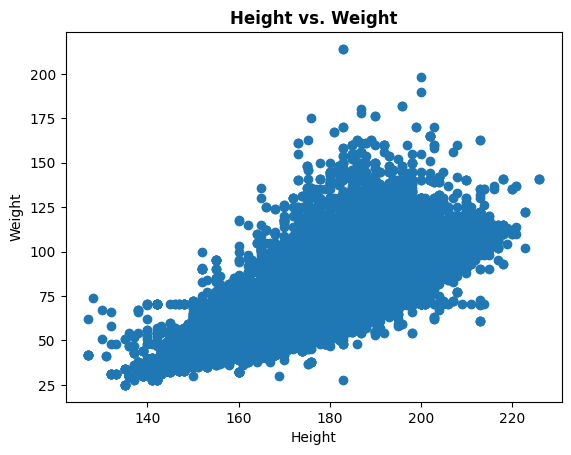

In [ ]:
x= ath['Height']
y= ath['Weight']
plt.scatter(x,y)
plt.title('Height vs. Weight' ,fontweight='bold')
plt.xlabel('Height')
plt.ylabel('Weight')

In [ ]:
import plotly.express as px # create entire figures at once,

In [ ]:
#Using plotly.express module (imported as px ) to create entire figures at once
#Setting x_Axis = Year, and y_Axis = Height
fig1 = px.scatter(ath, y=ath.Height, x=ath.Year, color=ath.Sex,
                   color_discrete_map={"M":"#BA55D3", "F":"#DEB887"},
                   title= 'Athletes Height over Time')
fig1.show()

In [ ]:
#Using plotly.express module (imported as px ) to create entire figures at once
#Setting x_Axis = Year, and y_Axis = Weight

fig2 = px.scatter(ath, y=ath.Weight, x=ath.Year, color=ath.Sex,
                   color_discrete_map={"M":"#BA55D3", "F":"#DEB887"},
                   title= 'Athlete Weight over Time')
fig2.show()

***Conclusion*** : The above plot shows that for both men and women, height and weight has increased gradually over the history of the Games. However, this plot could be hiding important variation since different body types are favored in different events.

2. ### **Number of male and female Olympians who had participated during 1896 to 2016**

<Axes: >

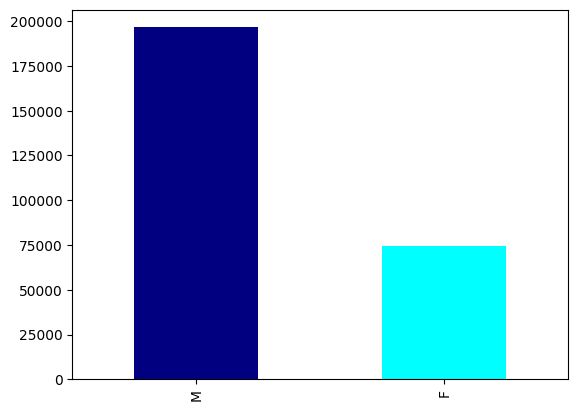

In [ ]:
#Plot a bar graph to find the number of Female and Male Olympians
ath['Sex'].value_counts().plot.bar(ath['Sex'], color=['navy', 'cyan'])

***Conclusion*** : The number of male Olympians have always been more than the number of female Olympians.


3. ### **Number of male and female Olympians over Season**

In [ ]:
#Plot a histogram by grouping in order to find the female vs. male participants in different seasons
fig = px.histogram(ath, x=ath.Season, color=ath.Sex, barmode = "group",
                   color_discrete_map={"M":"#BA55D3", "F":"#DEB887"})
fig.show()

4. ### **Top 5 countries who won the most medals**
* Here we are going to print the top 5 countries and show them in the graph with barplot

In [ ]:
#Assinging a variable to the top 5 team who have won the most medals
#sort_values() is being used in order to get the top 5.
top_5 = (ath.groupby(ath['Team'])['Medal'].sum()).sort_values(ascending=False).head(5)

In [ ]:
print(top_5)

Team
United States    9197
Soviet Union     4521
Germany          3967
Great Britain    3399
France           3222
Name: Medal, dtype: int64


Text(0, 0.5, 'Number of Medals')

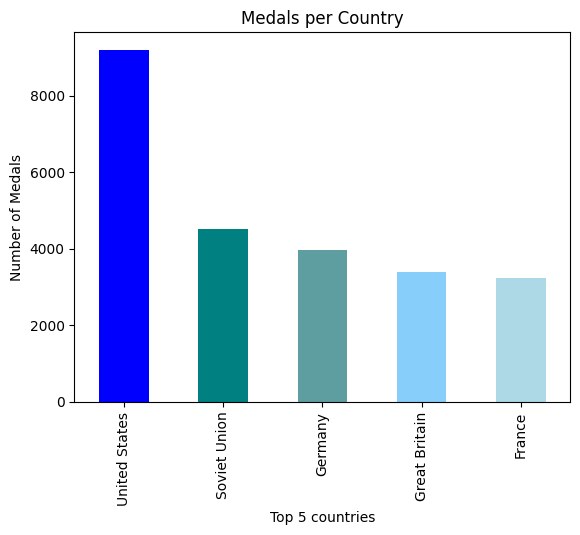

In [ ]:
top_5.plot.bar(color = ['blue','teal','cadetblue','lightskyblue','lightblue'])
plt.title('Medals per Country')
plt.xlabel('Top 5 countries')
plt.ylabel('Number of Medals')


***Conclusion*** : 
* The United States has a significant lead over every other country.
* The nation with the second-most Olympic medals is the Soviet Union.
* Third on the list of countries with the highest medal count at the Olympics is Germany..

5. ### **Number of each Medal won by each country participated in the Olympics**
* Here we are going to show the count of Golden, Silver and Bronze medals won by each country in the form of graph with histogram.

In [ ]:
#Create a new DataFrame which only consists of Year and Medals
new_data = pd.DataFrame({'Year': pd.Series(ath.Year), 'Medal': pd.Series(athlete.Medal)})

In [ ]:
new_data.dropna(inplace=True)

In [ ]:
fig = px.histogram(new_data, x=new_data.Year, color=new_data.Medal, barmode = "group",
                   color_discrete_map={"Gold":"#ffd966", "Silver": "#bcbcbc","Bronze":"#7f6000"},
                   title= 'Performance of Countries over Time')
fig.show()


***Conclusion*** : From the above graph we can observe missing values in the year 1940. 
* The **1940** Tokyo Summer Olympic Games are a non-event, because they never happened. 

6. ### **Number of female Olympians over Time**
* Here we are going to show the number of female Olympians over the course of time in the form of graph with histogram.

In [ ]:
fig_2 = px.histogram(ath[ath['Sex']=='F']['Sex'], x=ath['Year'], 
                     template="simple_white", labels={"x" : "Year"})
fig_2.show()

Thank you for reading through. This was my take on the analysis of the Olympics Dataset. If there were any inaccuracies, I would greatly appreciate any feedback or suggestions.